In [54]:
#FICHIER DE CELINE CONSTANT
import pandas as pd

data = pd.read_csv("./Airbnb_Open_Data.csv")
df = pd.DataFrame(data)

df.head()

/var/folders/nm/8l134y3n2ps5nn9pq_00xnnw0000gn/T/ipykernel_10153/1491672376.py:3: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("./Airbnb_Open_Data.csv")


,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN


In [55]:
df_cleaned = df.copy()

# Nettoyage des données
# Retirer les symboles $ et espaces dans les colonnes 'price' et 'service fee'
df_cleaned['price'] = df_cleaned['price'].replace({'\$': '', ',': '', ' ': ''}, regex=True).astype(float)
df_cleaned['service fee'] = df_cleaned['service fee'].replace({'\$': '', ',': '', ' ': ''}, regex=True).astype(float)

# Remplacer les valeurs manquantes dans certaines colonnes par des valeurs par défaut
df_cleaned['reviews per month'].fillna(0, inplace=True)  # Remplacer les NaN par 0 pour les reviews mensuels
df_cleaned['last review'] = pd.to_datetime(df_cleaned['last review'], errors='coerce')  # Conversion des dates

df_cleaned['long'] = df_cleaned['long'].replace({',': '', ' ': ''}, regex=True).astype(float)
df_cleaned['lat'] = df_cleaned['lat'].replace({',': '', ' ': ''}, regex=True).astype(float)

df_cleaned.head()

<>:5: SyntaxWarning: invalid escape sequence '\$'
<>:6: SyntaxWarning: invalid escape sequence '\$'
<>:5: SyntaxWarning: invalid escape sequence '\$'
<>:6: SyntaxWarning: invalid escape sequence '\$'
/var/folders/nm/8l134y3n2ps5nn9pq_00xnnw0000gn/T/ipykernel_10153/4091964771.py:5: SyntaxWarning: invalid escape sequence '\$'
  df_cleaned['price'] = df_cleaned['price'].replace({'\$': '', ',': '', ' ': ''}, regex=True).astype(float)
/var/folders/nm/8l134y3n2ps5nn9pq_00xnnw0000gn/T/ipykernel_10153/4091964771.py:6: SyntaxWarning: invalid escape sequence '\$'
  df_cleaned['service fee'] = df_cleaned['service fee'].replace({'\$': '', ',': '', ' ': ''}, regex=True).astype(float)
/var/folders/nm/8l134y3n2ps5nn9pq_00xnnw0000gn/T/ipykernel_10153/4091964771.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object 

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,193.0,10.0,9.0,2021-10-19,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,28.0,30.0,45.0,2022-05-21,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,124.0,3.0,0.0,NaT,0.00,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,74.0,30.0,270.0,2019-07-05,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,41.0,10.0,9.0,2018-11-19,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN


In [56]:
df_cleaned=df_cleaned.drop(columns=['reviews per month', 'minimum nights', 'host name', 'number of reviews', 'last review', 'calculated host listings count', 'availability 365', 'cancellation_policy', 'instant_bookable', 'review rate number', 'license', 'house_rules'  ])
private_room = df_cleaned[df_cleaned['room type']=='Private room'] #46556
entire_home = df_cleaned[df_cleaned['room type']=='Entire home/apt'] #53701
shared_room = df_cleaned[df_cleaned['room type']=='Shared room'] #2226
hotel_room = df_cleaned[df_cleaned['room type']=='Hotel room'] #116

entire_home.head()

,id,NAME,host id,host_identity_verified,neighbourhood group,neighbourhood,lat,long,country,country code,room type,Construction year,price,service fee
1,1002102,Skylit Midtown Castle,52335172823,verified,Manhattan,Midtown,40.75362,-73.98377,United States,US,Entire home/apt,2007.0,142.0,28.0
3,1002755,NaN,85098326012,unconfirmed,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,US,Entire home/apt,2005.0,368.0,74.0
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Manhattan,East Harlem,40.79851,-73.94399,United States,US,Entire home/apt,2009.0,204.0,41.0
5,1004098,Large Cozy 1 BR Apartment In Midtown East,45498551794,verified,Manhattan,Murray Hill,40.74767,-73.97500,United States,US,Entire home/apt,2013.0,577.0,115.0
10,1006859,Cute & Cozy Lower East Side 1 bdrm,1280143094,verified,Manhattan,Chinatown,40.71344,-73.99037,United States,US,Entire home/apt,2004.0,319.0,64.0


In [12]:
count_private_room = df[df['room type'] == 'Hotel room'].shape[0]
print(count_private_room)

116


In [60]:
#KMEANS
import pandas as pd
import folium
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns


# Charger les données, nettoyage, et suppression des NaN dans la colonne price
prix = shared_room['price'].dropna()
shared_room = shared_room.dropna(subset=['price'])

# Supprime les lignes où lat ou long est NaN
shared_room = shared_room.dropna(subset=['lat', 'long'])
prix = shared_room['price']

# Convertir prix en une matrice 2D et appliquer KMeans pour obtenir les clusters
prix_reshaped = prix.values.reshape(-1, 1)
shared_room['cluster'] = KMeans(n_clusters=4, random_state=0).fit_predict(prix_reshaped)

# Couleurs pour les clusters
colors = ['red', 'blue', 'green', 'yellow', 'magenta']  # Adapter selon le nombre de clusters

# Calcul du centre de la carte pour recentrer la vue sur les logements
map_center = [shared_room['lat'].mean(), shared_room['long'].mean()]
folium_map = folium.Map(location=map_center, zoom_start=10)

# Boucle pour ajouter chaque logement à la carte avec son cluster
for i, row in shared_room.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=6,
        color=colors[row['cluster']],  # Couleur en fonction du cluster
        fill=True,
        fill_color=colors[row['cluster']],
        fill_opacity=0.6,
        popup=row['NAME']  # Affiche le nom du logement en popup
    ).add_to(folium_map)

# Enregistrer et afficher la carte
folium_map.save('logements_clusters_map.html')
folium_map


In [81]:
#DBSCAN

import pandas as pd
import folium
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import seaborn as sns

# Charger les données, nettoyage, et suppression des NaN dans les colonnes `price`, `lat`, et `long`
shared_room = shared_room.dropna(subset=['price', 'lat', 'long'])

# Mise à l'échelle des coordonnées géographiques pour donner plus d'importance à la localisation
shared_room['lat_scaled'] = shared_room['lat'] * 1000
shared_room['long_scaled'] = shared_room['long'] * 1000

data_set = shared_room[['price', 'lat_scaled', 'long_scaled']]

# Standardiser les données pour chaque variable pour une échelle comparable
scaler = StandardScaler()
data_set_scaled = scaler.fit_transform(data_set)

# Couleurs pour les clusters
colors = ['red', 'blue', 'green', 'yellow', 'magenta']  # Adapter selon le nombre de clusters

# Application de DBSCAN
dbscan = DBSCAN(eps=0.03, min_samples=3)  

shared_room['cluster'] = dbscan.fit_predict(data_set_scaled)


colors = ['red', 'blue', 'green', 'purple', 'orange'] 


# Calcul des valeurs moyennes et des écarts-types des prix par cluster
price_stats = shared_room.groupby('cluster')['price'].agg(['mean', 'std']).rename(columns={'mean': 'price_mean', 'std': 'price_std'})
print("Valeurs moyennes et écarts-types des prix par cluster :")
print(price_stats)

# Définir les principaux points d'intérêt et calculer les distances moyennes
# Points d'intérêt : Times Square, Central Park, JFK Airport
points_of_interest = {
    'Times Square': (40.7580, -73.9855),
    'Central Park': (40.785091, -73.968285),
    'JFK Airport': (40.6413, -73.7781)
}

# Calcul des distances moyennes de chaque cluster aux points d'intérêt
distances_to_pois = {}
for poi_name, poi_coords in points_of_interest.items():
    distances = []
    for i, centroid in enumerate(centroids_original):
        centroid_coords = (centroid[0] / 1000, centroid[1] / 1000)  # Diviser par 1000 pour revenir aux coordonnées d'origine
        distance = geodesic(centroid_coords, poi_coords).kilometers
        distances.append(distance)
    distances_to_pois[poi_name] = distances

# Affichage des distances moyennes aux points d'intérêt pour chaque cluster
print("Distances moyennes aux points d'intérêt pour chaque cluster :")
for poi_name, distances in distances_to_pois.items():
    for cluster_id, distance in enumerate(distances):
         print(f"Cluster {cluster_id} - {poi_name} : {distance:.2f} km")

# Calcul du centre de la carte pour recentrer la vue sur les logements
map_center = [shared_room['lat'].mean(), shared_room['long'].mean()]
folium_map = folium.Map(location=map_center, zoom_start=10)

# Boucle pour ajouter chaque logement à la carte avec son cluster
for i, row in shared_room.iterrows():
    cluster_color = 'gray' if row['cluster'] == -1 else colors[row['cluster'] % len(colors)]  # -1 pour les outliers
    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=6,
        color=cluster_color,
        fill=True,
        fill_color=cluster_color,
        fill_opacity=0.6,
        popup=row['NAME']  # Affiche le nom du logement en popup
    ).add_to(folium_map)

# Enregistrer et afficher la carte
folium_map.save('logements_clusters_map_dbscan.html')
folium_map

Valeurs moyennes et écarts-types des prix par cluster :
         price_mean   price_std
cluster                        
-1       624.206839  336.349419
 0       281.000000    3.464102
 1       558.666667    1.154701
 2       738.333333    2.886751
 3       317.000000    0.000000
...             ...         ...
 120     263.000000    3.464102
 121     565.666667    4.041452
 122      85.333333    2.886751
 123     526.000000    3.464102
 124     509.000000    0.000000

[126 rows x 2 columns]
Distances moyennes aux points d'intérêt pour chaque cluster :
Cluster 0 - Times Square : 10.54 km
Cluster 1 - Times Square : 3.17 km
Cluster 2 - Times Square : 12.24 km
Cluster 3 - Times Square : 3.88 km
Cluster 0 - Central Park : 13.31 km
Cluster 1 - Central Park : 5.20 km
Cluster 2 - Central Park : 11.78 km
Cluster 3 - Central Park : 1.16 km
Cluster 0 - JFK Airport : 15.37 km
Cluster 1 - JFK Airport : 18.64 km
Cluster 2 - JFK Airport : 12.13 km
Cluster 3 - JFK Airport : 21.76 km


In [73]:
#Agglomerative Clustering
import pandas as pd
import folium
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
import seaborn as sns

# Charger les données, nettoyage, et suppression des NaN dans les colonnes `price`, `lat`, et `long`
shared_room = shared_room.dropna(subset=['price', 'lat', 'long'])

# Mise à l'échelle des coordonnées géographiques pour donner plus d'importance à la localisation
shared_room['lat_scaled'] = shared_room['lat'] * 1000
shared_room['long_scaled'] = shared_room['long'] * 1000

data_set = shared_room[['price', 'lat_scaled', 'long_scaled']]

# Standardiser les données pour chaque variable pour une échelle comparable
scaler = StandardScaler()
data_set_scaled = scaler.fit_transform(data_set)

# Agglomerative Clustering avec une distance de type "Ward" pour assurer des clusters contigus
clustering = AgglomerativeClustering(n_clusters=4, linkage='ward')
shared_room['cluster'] = clustering.fit_predict(data_set_scaled)


# Calcul des valeurs moyennes et des écarts-types des prix par cluster
price_stats = shared_room.groupby('cluster')['price'].agg(['mean', 'std']).rename(columns={'mean': 'price_mean', 'std': 'price_std'})
print("Valeurs moyennes et écarts-types des prix par cluster :")
print(price_stats)

# Définir les principaux points d'intérêt et calculer les distances moyennes
# Points d'intérêt : Times Square, Central Park, JFK Airport
points_of_interest = {
    'Times Square': (40.7580, -73.9855),
    'Central Park': (40.785091, -73.968285),
    'JFK Airport': (40.6413, -73.7781)
}

# Calcul des distances moyennes de chaque cluster aux points d'intérêt
distances_to_pois = {}
for poi_name, poi_coords in points_of_interest.items():
    distances = []
    for i, centroid in enumerate(centroids_original):
        centroid_coords = (centroid[0] / 1000, centroid[1] / 1000)  # Diviser par 1000 pour revenir aux coordonnées d'origine
        distance = geodesic(centroid_coords, poi_coords).kilometers
        distances.append(distance)
    distances_to_pois[poi_name] = distances

# Affichage des distances moyennes aux points d'intérêt pour chaque cluster
print("Distances moyennes aux points d'intérêt pour chaque cluster :")
for poi_name, distances in distances_to_pois.items():
    for cluster_id, distance in enumerate(distances):
         print(f"Cluster {cluster_id} - {poi_name} : {distance:.2f} km")


# Affichage des résultats sur une carte Folium avec couleurs pour les clusters
colors = ['red', 'blue', 'green', 'yellow', 'magenta']
map_center = [shared_room['lat'].mean(), shared_room['long'].mean()]
folium_map = folium.Map(location=map_center, zoom_start=10)

#Boucle pour ajouter chaque logement à la carte avec son cluster
for i, row in shared_room.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=6,
        color=colors[row['cluster']],  # Couleur en fonction du cluster
        fill=True,
        fill_color=colors[row['cluster']],
        fill_opacity=0.6,
        popup=row.get('NAME', 'No Name')  # Affiche le nom du logement en popup
    ).add_to(folium_map)

# Ajouter les centroïdes des clusters sur la carte pour visualiser les centres des clusters
for idx, centroid in enumerate(centroids_original):
    folium.Marker(
        location=[centroid[0] / 1000, centroid[1] / 1000],
        icon=folium.Icon(color=colors[idx], icon="info-sign"),
        popup=f"Cluster {idx} - Centre"
    ).add_to(folium_map)

# Enregistrer la carte
folium_map.save('logements_clusters_map.html')
folium_map

Valeurs moyennes et écarts-types des prix par cluster :
         price_mean   price_std
cluster                        
0        976.362398  149.655200
1        418.966997  233.966617
2        685.416327  340.107104
3        427.536364  228.691773
Distances moyennes aux points d'intérêt pour chaque cluster :
Cluster 0 - Times Square : 10.54 km
Cluster 1 - Times Square : 3.17 km
Cluster 2 - Times Square : 12.24 km
Cluster 3 - Times Square : 3.88 km
Cluster 0 - Central Park : 13.31 km
Cluster 1 - Central Park : 5.20 km
Cluster 2 - Central Park : 11.78 km
Cluster 3 - Central Park : 1.16 km
Cluster 0 - JFK Airport : 15.37 km
Cluster 1 - JFK Airport : 18.64 km
Cluster 2 - JFK Airport : 12.13 km
Cluster 3 - JFK Airport : 21.76 km


/var/folders/nm/8l134y3n2ps5nn9pq_00xnnw0000gn/T/ipykernel_10153/457188192.py:77: UserWarning: color argument of Icon should be one of: {'darkgreen', 'lightgreen', 'red', 'darkblue', 'green', 'blue', 'purple', 'darkred', 'gray', 'white', 'lightred', 'lightgray', 'darkpurple', 'pink', 'beige', 'black', 'lightblue', 'cadetblue', 'orange'}.
  icon=folium.Icon(color=colors[idx], icon="info-sign"),


In [61]:
#cluster avec lat et long pour avoir des clusters plus régionaux
#KMEANS
import pandas as pd
import folium
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns

# Charger les données, nettoyage, et suppression des NaN dans la colonne price
prix = shared_room['price'].dropna()
shared_room = shared_room.dropna(subset=['price'])

# Supprime les lignes où lat ou long est NaN
shared_room = shared_room.dropna(subset=['lat', 'long'])
data_set = shared_room[['price', 'lat', 'long']]
print(data_set)

# Convertir prix en une matrice 2D et appliquer KMeans pour obtenir les clusters
shared_room['cluster'] = KMeans(n_clusters=4, random_state=0).fit_predict(data_set)

print(shared_room[['price', 'lat', 'long', 'cluster']])
# Couleurs pour les clusters
colors = ['red', 'blue', 'green', 'yellow', 'magenta'] 

# Calcul du centre de la carte pour recentrer la vue sur les logements
map_center = [shared_room['lat'].mean(), shared_room['long'].mean()]
folium_map = folium.Map(location=map_center, zoom_start=10)

# Boucle pour ajouter chaque logement à la carte avec son cluster
for i, row in shared_room.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=6,
        color=colors[row['cluster']],  
        fill=True,
        fill_color=colors[row['cluster']],
        fill_opacity=0.6,
        popup=row['NAME']  # Affiche le nom du logement en popup
    ).add_to(folium_map)

# Enregistrer et afficher la carte
folium_map.save('logements_clusters_map.html')
folium_map


         price       lat      long
40      1010.0  40.71401 -73.98917
204      586.0  40.76548 -73.98474
358      599.0  40.79406 -73.94102
493       67.0  40.80827 -73.95329
546      910.0  40.76739 -73.95570
...        ...       ...       ...
102392  1144.0  40.74186 -73.99769
102509   406.0  40.81161 -73.94306
102534   151.0  40.77734 -73.95779
102560   690.0  40.74439 -73.92163
102574   220.0  40.72815 -73.97598

[2218 rows x 3 columns]
         price       lat      long  cluster
40      1010.0  40.71401 -73.98917        1
204      586.0  40.76548 -73.98474        2
358      599.0  40.79406 -73.94102        2
493       67.0  40.80827 -73.95329        0
546      910.0  40.76739 -73.95570        3
...        ...       ...       ...      ...
102392  1144.0  40.74186 -73.99769        1
102509   406.0  40.81161 -73.94306        2
102534   151.0  40.77734 -73.95779        0
102560   690.0  40.74439 -73.92163        3
102574   220.0  40.72815 -73.97598        0

[2218 rows x 4 columns]


In [62]:
#Clustering avec lat et long normalisés 
import pandas as pd
import folium
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns

# Charger les données, nettoyage, et suppression des NaN dans la colonne price
prix = shared_room['price'].dropna()
shared_room = shared_room.dropna(subset=['price'])

# Supprime les lignes où lat ou long est NaN
shared_room = shared_room.dropna(subset=['lat', 'long'])

# Mise à l’échelle des coordonnées géographiques pour donner plus d'importance à la localisation
shared_room['lat_scaled'] = shared_room['lat'] * 1000
shared_room['long_scaled'] = shared_room['long'] * 1000

# Créer un DataFrame pour le clustering en incluant les variables transformées
data_set = shared_room[['price', 'lat_scaled', 'long_scaled']]

# Standardiser les données pour que chaque feature ait une échelle comparable
scaler = StandardScaler()
data_set_scaled = scaler.fit_transform(data_set)

# Application de KMeans pour obtenir les clusters
kmeans = KMeans(n_clusters=4, random_state=0)
shared_room['cluster'] = kmeans.fit_predict(data_set_scaled)

# Affichage des résultats
print(shared_room[['price', 'lat_scaled', 'long_scaled', 'cluster']])

# Couleurs pour les clusters
colors = ['red', 'blue', 'green', 'yellow', 'magenta'] 

# Calcul du centre de la carte pour recentrer la vue sur les logements
map_center = [shared_room['lat'].mean(), shared_room['long'].mean()]
folium_map = folium.Map(location=map_center, zoom_start=10)

# Boucle pour ajouter chaque logement à la carte avec son cluster
for i, row in shared_room.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=6,
        color=colors[row['cluster']],  # Couleur en fonction du cluster
        fill=True,
        fill_color=colors[row['cluster']],
        fill_opacity=0.6,
        popup=row.get('NAME', 'No Name')  # Affiche le nom du logement en popup
    ).add_to(folium_map)

# Enregistrer et afficher la carte
folium_map.save('logements_clusters_map.html')
folium_map

         price  lat_scaled  long_scaled  cluster
40      1010.0    40714.01    -73989.17        1
204      586.0    40765.48    -73984.74        3
358      599.0    40794.06    -73941.02        3
493       67.0    40808.27    -73953.29        3
546      910.0    40767.39    -73955.70        1
...        ...         ...          ...      ...
102392  1144.0    40741.86    -73997.69        1
102509   406.0    40811.61    -73943.06        3
102534   151.0    40777.34    -73957.79        3
102560   690.0    40744.39    -73921.63        1
102574   220.0    40728.15    -73975.98        3

[2218 rows x 4 columns]


In [66]:
import pandas as pd
import folium
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import numpy as np
from geopy.distance import geodesic

# Charger les données, nettoyage, et suppression des NaN dans la colonne price
prix = shared_room['price'].dropna()
shared_room = shared_room.dropna(subset=['price'])

# Supprime les lignes où lat ou long est NaN
shared_room = shared_room.dropna(subset=['lat', 'long'])

# Mise à l’échelle des coordonnées géographiques pour donner plus d'importance à la localisation
shared_room['lat_scaled'] = shared_room['lat'] * 1000
shared_room['long_scaled'] = shared_room['long'] * 1000

# Créer un DataFrame pour le clustering en incluant les variables transformées
data_set = shared_room[['price', 'lat_scaled', 'long_scaled']]

# Standardiser les données pour que chaque feature ait une échelle comparable
scaler = StandardScaler()
data_set_scaled = scaler.fit_transform(data_set)

# Application de KMeans pour obtenir les clusters
kmeans = KMeans(n_clusters=4, random_state=0)
shared_room['cluster'] = kmeans.fit_predict(data_set_scaled)

# Calcul des valeurs moyennes et des écarts-types des prix par cluster
# price_stats = shared_room.groupby('cluster')['price'].agg(['mean', 'std']).rename(columns={'mean': 'price_mean', 'std': 'price_std'})
# print("Valeurs moyennes et écarts-types des prix par cluster :")
# print(price_stats)

# Calcul des centroïdes des clusters
centroids = kmeans.cluster_centers_
# On inverse la transformation de mise à l’échelle pour retrouver les coordonnées originales
centroids_original = scaler.inverse_transform(centroids)[:, 1:3]
# print("Centroïdes des clusters (latitude et longitude) :")
# for i, centroid in enumerate(centroids_original):
#     print(f"Cluster {i} - Latitude : {centroid[0]/1000}, Longitude : {centroid[1]/1000}")

# Définir les principaux points d'intérêt et calculer les distances moyennes
# Points d'intérêt : Times Square, Central Park, JFK Airport
points_of_interest = {
    'Times Square': (40.7580, -73.9855),
    'Central Park': (40.785091, -73.968285),
    'JFK Airport': (40.6413, -73.7781)
}

# Calcul des distances moyennes de chaque cluster aux points d'intérêt
distances_to_pois = {}
for poi_name, poi_coords in points_of_interest.items():
    distances = []
    for i, centroid in enumerate(centroids_original):
        centroid_coords = (centroid[0] / 1000, centroid[1] / 1000)  # Diviser par 1000 pour revenir aux coordonnées d'origine
        distance = geodesic(centroid_coords, poi_coords).kilometers
        distances.append(distance)
    distances_to_pois[poi_name] = distances

# Affichage des distances moyennes aux points d'intérêt pour chaque cluster
# print("Distances moyennes aux points d'intérêt pour chaque cluster :")
# for poi_name, distances in distances_to_pois.items():
#     for cluster_id, distance in enumerate(distances):
#         print(f"Cluster {cluster_id} - {poi_name} : {distance:.2f} km")


# Affichage des résultats sur une carte Folium avec couleurs pour les clusters
colors = ['red', 'blue', 'green', 'yellow', 'magenta']
map_center = [shared_room['lat'].mean(), shared_room['long'].mean()]
folium_map = folium.Map(location=map_center, zoom_start=10)

#Boucle pour ajouter chaque logement à la carte avec son cluster
for i, row in shared_room.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=6,
        color=colors[row['cluster']],  # Couleur en fonction du cluster
        fill=True,
        fill_color=colors[row['cluster']],
        fill_opacity=0.6,
        popup=row.get('NAME', 'No Name')  # Affiche le nom du logement en popup
    ).add_to(folium_map)

# Ajouter les centroïdes des clusters sur la carte pour visualiser les centres des clusters
for idx, centroid in enumerate(centroids_original):
    folium.Marker(
        location=[centroid[0] / 1000, centroid[1] / 1000],
        icon=folium.Icon(color=colors[idx], icon="info-sign"),
        popup=f"Cluster {idx} - Centre"
    ).add_to(folium_map)

# Enregistrer la carte
folium_map.save('logements_clusters_map.html')
folium_map


/var/folders/nm/8l134y3n2ps5nn9pq_00xnnw0000gn/T/ipykernel_10153/2362110272.py:89: UserWarning: color argument of Icon should be one of: {'darkgreen', 'lightgreen', 'red', 'darkblue', 'green', 'blue', 'purple', 'darkred', 'gray', 'white', 'lightred', 'lightgray', 'darkpurple', 'pink', 'beige', 'black', 'lightblue', 'cadetblue', 'orange'}.
  icon=folium.Icon(color=colors[idx], icon="info-sign"),


In [65]:
#Manipulation avec les borouhgs
#['Brooklyn' 'Manhattan' 'brookln' 'manhatan' 'Queens' nan 'Staten Island', 'Bronx']
import pandas as pd


cluster_borough_distribution = pd.crosstab(shared_room['neighbourhood group'], shared_room['cluster'])
# Afficher les résultats
print("Répartition des clusters par quartier :")
print(cluster_borough_distribution)


Répartition des clusters par quartier :
cluster                0    1    2    3
neighbourhood group                    
Bronx                  0   14   37   66
Brooklyn             551  240   21    8
Manhattan             53  387    0  464
Queens                 7   73  210   72
Staten Island         13    2    0    0


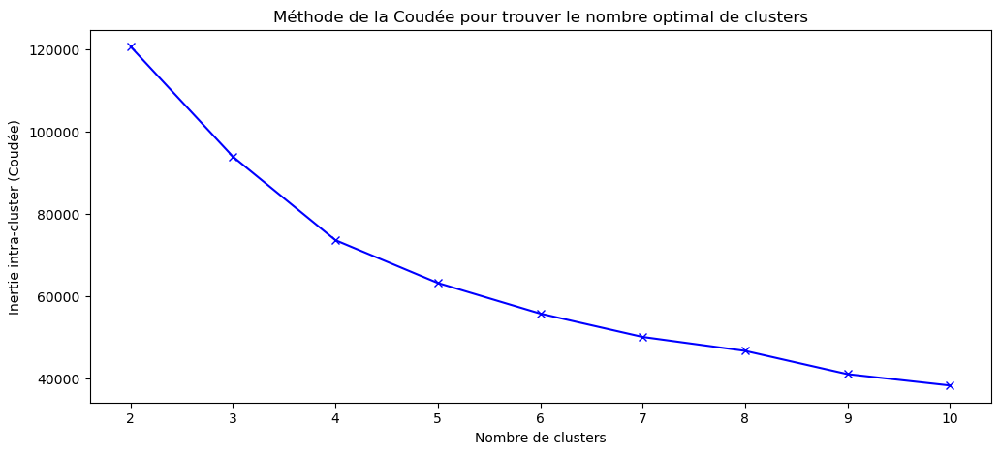

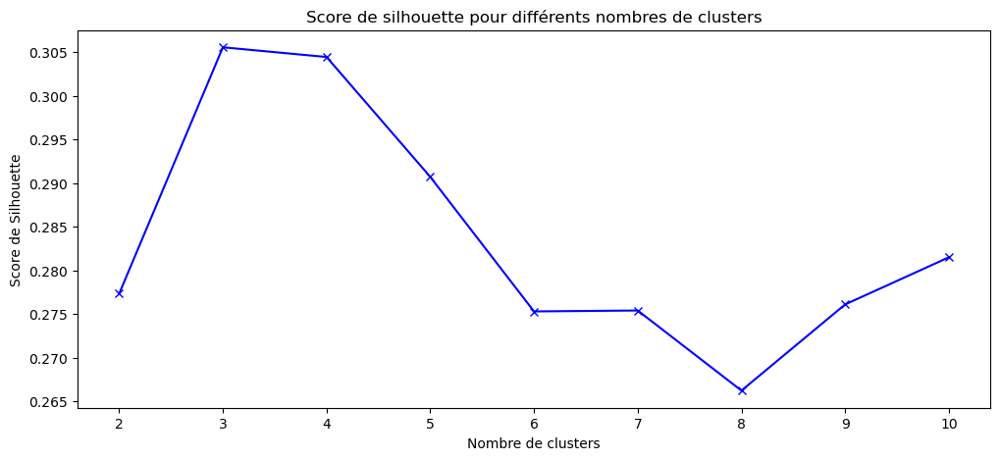

In [82]:
#Methode de la coudée pour calculer le nombre de clusters pour une catégorie de logements
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Liste pour stocker les valeurs d'inertie et les scores de silhouette
inertia = []
silhouette_scores = []

# Charger les données, nettoyage, et suppression des NaN dans la colonne price
prix = df_cleaned['price'].dropna()
df_cleaned = df_cleaned.dropna(subset=['price'])

# Supprime les lignes où lat ou long est NaN
df_cleaned = df_cleaned.dropna(subset=['lat', 'long'])

# Mise à l’échelle des coordonnées géographiques pour donner plus d'importance à la localisation
df_cleaned['lat_scaled'] = df_cleaned['lat'] * 1000
df_cleaned['long_scaled'] = df_cleaned['long'] * 1000

# Créer un DataFrame pour le clustering en incluant les variables transformées
data_set = df_cleaned[['price', 'lat_scaled', 'long_scaled']]

# Standardiser les données pour que chaque feature ait une échelle comparable
scaler = StandardScaler()
data_set_scaled = scaler.fit_transform(data_set)

# Parcourir les nombres de clusters possibles
for n_clusters in range(2, 11):
    # Application de KMeans pour obtenir les clusters
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(data_set_scaled)  # data = vos données à clustériser
    inertia.append(kmeans.inertia_)    # Coût d'inertie pour la méthode de la coudée
    silhouette_scores.append(silhouette_score(data_set_scaled, labels))  # Score de silhouette

# Afficher le graphique de la méthode de la coudée
plt.figure(figsize=(12, 5))
plt.plot(range(2, 11), inertia, 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel("Inertie intra-cluster (Coudée)")
plt.title("Méthode de la Coudée pour trouver le nombre optimal de clusters")
plt.show()

# Afficher le graphique des scores de silhouette
plt.figure(figsize=(12, 5))
plt.plot(range(2, 11), silhouette_scores, 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel("Score de Silhouette")
plt.title("Score de silhouette pour différents nombres de clusters")
plt.show()


In [30]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Liste pour stocker les valeurs d'inertie et les scores de silhouette
inertia = []
silhouette_scores = []

# Créer un DataFrame pour le clustering en incluant les variables transformées
df_cleaned = df_cleaned.dropna(subset=['price'])
data_set = df_cleaned[['price']] 

for n_clusters in range(2, 11):
    # Application de KMeans pour obtenir les clusters
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(data_set)  
    inertia.append(kmeans.inertia_)    # Coût d'inertie pour la méthode de la coudée
    silhouette_scores.append(silhouette_score(data_set, labels))  # Score de silhouette

# Afficher le graphique de la méthode de la coudée
plt.figure(figsize=(12, 5))
plt.plot(range(2, 11), inertia, 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel("Inertie intra-cluster (Coudée)")
plt.title("Méthode de la Coudée pour trouver le nombre optimal de clusters")
plt.show()

# Afficher le graphique des scores de silhouette
plt.figure(figsize=(12, 5))
plt.plot(range(2, 11), silhouette_scores, 'bx-')
plt.xlabel('Nombre de clusters')
plt.ylabel("Score de Silhouette")
plt.title("Score de silhouette pour différents nombres de clusters")
plt.show()


KeyboardInterrupt: 

In [ ]:
#réalisation d'un clustering sur l'ensemble des données de logement pour voir si on récupère bien des clusters correspondant au type de logement
import pandas as pd
import folium
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import numpy as np
from geopy.distance import geodesic

# Créer un DataFrame pour le clustering en incluant les variables transformées
df_cleaned = df_cleaned.dropna(subset=['price'])
data_set = df_cleaned['price']

# Application de KMeans pour obtenir les clusters
kmeans = KMeans(n_clusters=4, random_state=0)
shared_room['cluster'] = kmeans.fit_predict(data_set)

shared
